**Introduction**

In the notebook below I will perform an exploratory data analysis and build a time series prediction model using the XGBoost machine learning algorithm. My main goal is to find some interesting insights and correlations between time and consumption.

This dataset was acquired from an RTO (regional transmission organization) called PJM Interconnection LLC. Regional transmission organizations control and coordinate multi-state grids that span across state borders. They were created to promote energy efficiency, reliability, and non-discriminatory practices. The introduction of RTOs largely changed the economic landscape of some states as before their creation individual states had a monopoly on the generation and distribution of electricity within their state. 

PJM Interconnection LLC is responsible for the eastern states like Delaware, Illinois, Indiana, Kentucky, etc. The consumption data is displayed in MW.

**Importing libraries**

In [173]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
from bokeh.plotting import figure, show, output_notebook
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

plt.style.use("ggplot") # Set plot style
%matplotlib inline

**Importing the dataset**

In [174]:
df = pd.read_csv(r"./PJME_hourly.csv")



The feature engineering part was split into two for practical purposes. Part one contains features that were diverted from the DateTime column without too much data manipulation.

In [175]:
df["Datetime"] = pd.to_datetime(df["Datetime"])

#Date features
df["Hour"] = df["Datetime"].dt.hour
df["Day"] = df["Datetime"].dt.dayofweek
df["Month"] = df["Datetime"].dt.month
df["Year"] = df["Datetime"].dt.year
df["Q"] = df["Datetime"].dt.quarter
df["Dayofyear"] = df["Datetime"].dt.dayofyear
df["Dayofmonth"] = df["Datetime"].dt.day
df["Weekofyear"] = df["Datetime"].dt.weekofyear

df["Drop_me"] = df["Datetime"].dt.strftime("%m-%d")

df.index = df["Datetime"]
df = df.drop(["Datetime"],axis=1)

**Look at the data**

We are going to take a closer look at the data and highlight some interesting patterns in the consumption data. The first plot we are going to make is an interactive distribution plot made using the Bookeh plotting library.

In [176]:
p = figure(title="Consumption Distribution")

hist, edges = np.histogram(df["PJME_MW"], density=True, bins=50)
p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
           fill_color="navy", line_color="white", alpha=0.5)

output_notebook()
show(p)

Loading BokehJS ...

The distribution plot is slightly left-skewed, with the majority of the consumption moving around the 30-35k range.

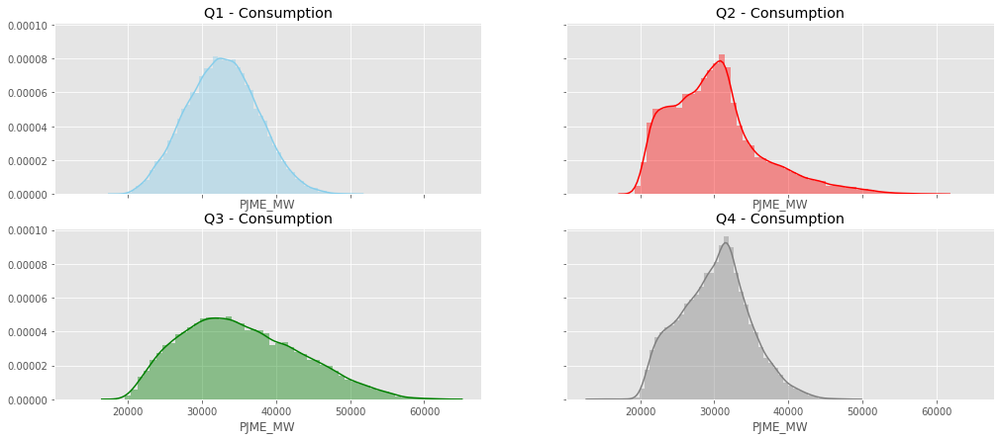

In [177]:
#Data prep
Q1 = df[df["Q"]==1]
Q2 = df[df["Q"]==2]
Q3 = df[df["Q"]==3]
Q4 = df[df["Q"]==4]

#Plot
fig,axes = plt.subplots(2,2,figsize=(17,7),sharex=True,sharey=True)

sns.distplot(Q1["PJME_MW"],color="skyblue", ax=axes[0,0]).set_title("Q1 - Consumption")
sns.distplot(Q2["PJME_MW"],color="red", ax=axes[0,1]).set_title("Q2 - Consumption")
sns.distplot(Q3["PJME_MW"],color="green", ax=axes[1,0]).set_title("Q3 - Consumption")
sns.distplot(Q4["PJME_MW"],color="gray", ax=axes[1,1]).set_title("Q4 - Consumption")

del Q1, Q2, Q3, Q4

There are some major differences in the consumption distribution per quarter. This might be due to several factors, the most obvious being seasonal demand changes. Another major factor is the general temperature in the area. Higher temperatures encourage more electricity usage as office buildings and homes require cooling.

Additionally,  most office buildings have HVAC systems with a temperature baseline. Some buildings for instance, have a baseline around 15.5 celsius and everything above or below that number generally triggers the cooling/heating systems

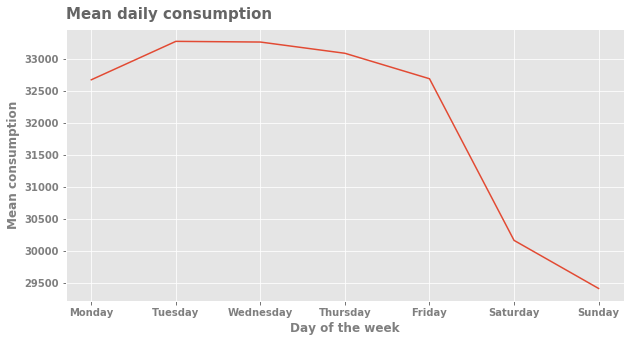

In [178]:
#Data prep
mean_per_day = df.groupby("Day")["PJME_MW"].agg(["mean"])

#Plot
fig, ax = plt.subplots(figsize=(10,5))


plt.plot(mean_per_day.index,mean_per_day["mean"])

plt.xticks(mean_per_day.index, ["Monday","Tuesday", "Wednesday", "Thursday", "Friday", "Saturday","Sunday"], alpha=0.75, weight="bold")
plt.yticks(alpha=0.75, weight="bold")

plt.xlabel("Day of the week",alpha=0.75, weight="bold")
plt.ylabel("Mean consumption",alpha=0.75, weight="bold")

plt.title("Mean daily consumption", alpha=0.60, weight="bold", fontsize=15, loc="left", pad=10)

del mean_per_day

The plot above showcases the cumulative consumption per day. We can very clearly see that days matter when it comes to consumption. The lowest usage is usually marked on the weekends as most commercial and industrial areas stay closed reducing the overall consumption of the area.

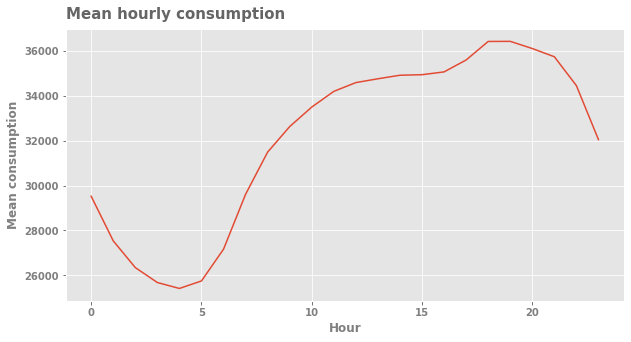

In [179]:
#Data
mean_per_hour = df.groupby("Hour")["PJME_MW"].agg(["mean"])

#Plot
fig, ax = plt.subplots(figsize=(10,5))

plt.plot(mean_per_hour.index, mean_per_hour["mean"])

plt.xticks(alpha=0.75, weight="bold")
plt.yticks(alpha=0.75, weight="bold")

plt.xlabel("Hour",alpha=0.75, weight="bold")
plt.ylabel("Mean consumption",alpha=0.75, weight="bold")

plt.title("Mean hourly consumption", alpha=0.60, weight="bold", fontsize=15, loc="left", pad=10)

del mean_per_hour

Looking at hourly consumption we can clearly see the peak and off-peak  hours of the area.

Text(0.0, 1.0, 'Consumption over time')

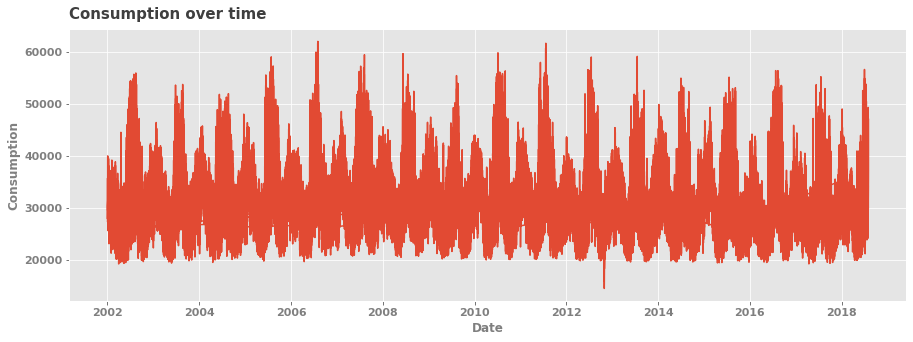

In [180]:
fig,ax = plt.subplots(figsize=(15,5))

plt.plot(df.index,df["PJME_MW"])

plt.xlabel("Date", alpha=0.75, weight="bold")
plt.ylabel("Consumption", alpha=0.75, weight="bold")

plt.xticks(alpha=0.75,weight="bold", fontsize=11)
plt.yticks(alpha=0.75,weight="bold", fontsize=11)

plt.title("Consumption over time", alpha=0.75, weight="bold", fontsize=15, pad=10, loc="left")

Looking at the consumption data as a whole we can very clearly see a pattern with peaks and valleys. While the baseline consumption stayed pretty much the sam on around 20.000. 

**Feature engineering - Part I**

During the second part, we will add columns that will help train the model and help it predict future consumption.

The categorical features added are:

1.	Holidays - I included some more famous American holidays.
2.	Worktime - If the half-hourly consumption demand happened during the usual worktime of most companies.
3. 	Peak/Off-Peak - I diverted this feature from the EDA above.
4.	Weekend/NonWeekend - If the day is a working day or not. I am aware that this might be duplicating information as we have other columns that that indicate the exact day, but I would nonetheless like to cover all my bases.

The numerical features:

1. Lag Variables - a shift in the data. I will explain more about this when we reach the cell.
2. Temperature data (not included) - I initially wanted to include the average temperature for each day. Unfortunately,  this is an RTO and as the name implies it covers multiple regions/states so getting and implementing good data was too difficult for now.



In [181]:
#Be ready for some bruteforce if functions
def feature_holidays(row):

    if row["Drop_me"] == "01-01":
        return "New Year"
    if row["Drop_me"] == "04-07":
        return "Ind Day"
    if row["Drop_me"] == "11-28":
        return "Thanksgiving"
    if row["Drop_me"] == "12-25":
        return "Christmas"
    return 'Other'
def feature_worktime(row):
    if row["Hour"] > 7 & row["Hour"] <= 17:
        return "Worktime"
    return "NonWorkTime"
def feature_peak(row):
    if row["Hour"] > 7 & row["Hour"] <= 22:
        return "Peak"
    return "NonPeak"
def feature_weekend(row):
    if row["Day"] == 5 or row["Day"] == 6:
        return "Weekend"
    return "NonWeekend"

In [182]:
df["Holiday"] = df.apply (lambda row : feature_holidays(row), axis=1)
df["Work"] = df.apply(lambda row: feature_worktime(row), axis=1)
df["Peak"] = df.apply(lambda row: feature_peak(row), axis=1)
df["Weekend"] = df.apply(lambda row: feature_weekend(row), axis=1)

In [183]:
df = df.drop(["Drop_me"],axis=1)

In [184]:
dummies = pd.get_dummies(df[["Holiday","Peak","Work","Weekend"]],prefix="Dummy")
df = df.join(dummies,lsuffix="_left")
df = df.drop(df[["Holiday","Peak","Work","Weekend"]], axis=1)

Below we are separating the dataset based on a date.

In [185]:
train_test_date = "01-01-2015"
consum_test = df[df.index > train_test_date].copy()
consum_train = df[df.index <= train_test_date].copy()

Lag variables are a classic approach to solving supervised regression problems on a time series dataset. The logic behind it is very simple, it uses the last variable to predict the next one. This adds additional features to the dataset and is usually very accurate.

There is, unfortunately, a downside to using Lag variables. They produce some NA values in the columns where the data is not available forcing us to drop them. This can severely reduce the number of rows we have for the training and testing of the algorithm. 

In [186]:
def lag_features(lag_dataset,period_list):

    temp_data = lag_dataset["PJME_MW"]

    for period in period_list:

        lag_dataset["lag_consumption_{}".format(period)] = temp_data.shift(period)
        lag_dataset["mean_rolling_{}".format(period)] = temp_data.rolling(period).mean()
        lag_dataset["max_rolling_{}".format(period)] = temp_data.rolling(period).max()
        lag_dataset["min_rolling_{}".format(period)] = temp_data.rolling(period).min()

    for column in lag_dataset.columns[20:]:

        lag_dataset[column] = lag_dataset[column].fillna(lag_dataset.groupby("Hour")["PJME_MW"].transform("mean"))
    
    return lag_dataset

In [187]:
consum_train = lag_features(consum_train,[7,14,30])

consum_test = lag_features(consum_test,[7,14,30])

Text(0.0, 1.0, 'Train - Test Split')

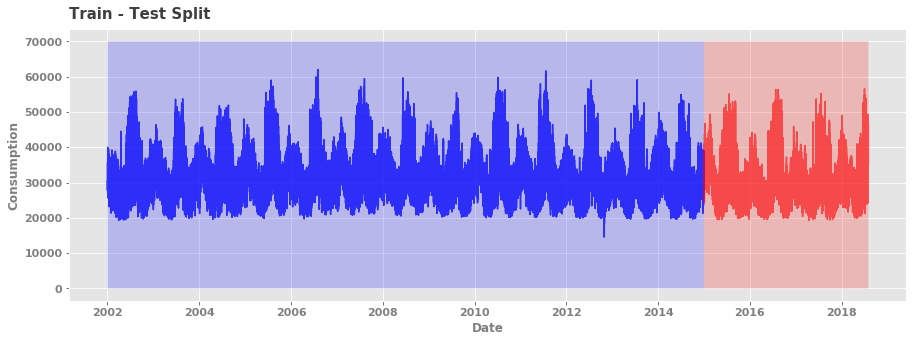

In [203]:
fig,ax = plt.subplots(figsize=(15,5))

coloring = 70000

plt.plot(consum_train.index,consum_train["PJME_MW"],color="blue", alpha=0.75)
plt.fill_between(consum_train.index,coloring, facecolor="blue", alpha=0.2)

plt.plot(consum_test.index,consum_test["PJME_MW"], color = "red", alpha=0.60)
plt.fill_between(consum_test.index,coloring, facecolor="red", alpha=0.2)

plt.xlabel("Date", alpha=0.75, weight="bold")
plt.ylabel("Consumption", alpha=0.75, weight="bold")

plt.xticks(alpha=0.75,weight="bold", fontsize=11)
plt.yticks(alpha=0.75,weight="bold", fontsize=11)

plt.title("Train - Test Split", alpha=0.75, weight="bold", fontsize=15, pad=10, loc="left")

In [189]:
#Train - Test
X_train = consum_train.drop("PJME_MW", axis=1) 
y_train = consum_train["PJME_MW"]
X_test = consum_test.drop("PJME_MW", axis=1)
y_test = consum_test["PJME_MW"]

In [190]:
#XGBoost

xgd_reg = xgb.XGBRegressor(n_estimators=1000)

xgd_reg.fit(X_train,y_train,
           eval_set=[(X_train,y_train),(X_test,y_test)],
           early_stopping_rounds=50,
           verbose=False)

[21:40:01] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(n_estimators=1000)

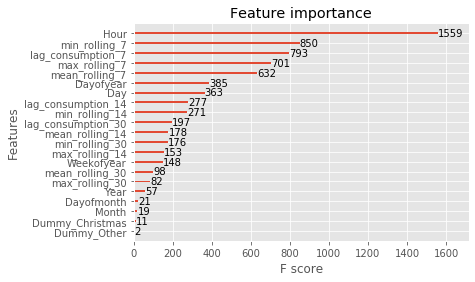

In [191]:
plot_importance(xgd_reg)

The plot importance option of XGBoost allows us to evaluate what features are good if we would like to use this algorithm in an automated pipeline or for any future use.

In [192]:
consum_test["Prediction"] = xgd_reg.predict(X_test)

Text(0.0, 1.0, 'Predicted consumption')

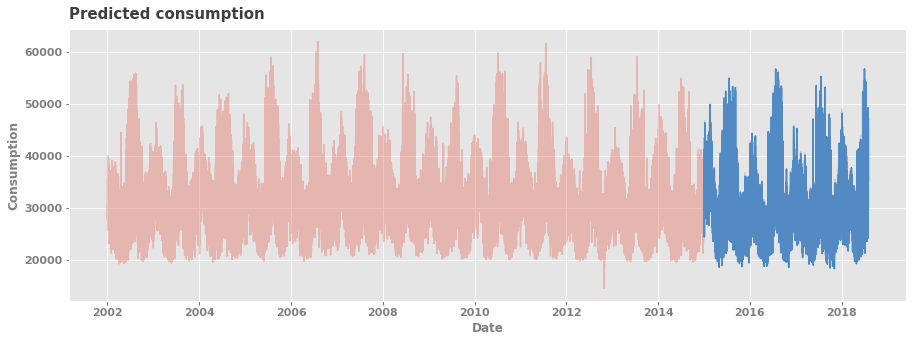

In [193]:
fig,ax = plt.subplots(figsize=(15,5))

plt.plot(consum_train.index,consum_train["PJME_MW"],alpha=.3)
plt.plot(consum_test.index,consum_test["Prediction"])
plt.plot(consum_test.index,consum_test["PJME_MW"],alpha=.3)

plt.xlabel("Date", alpha=0.75, weight="bold")
plt.ylabel("Consumption", alpha=0.75, weight="bold")

plt.xticks(alpha=0.75,weight="bold", fontsize=11)
plt.yticks(alpha=0.75,weight="bold", fontsize=11)

plt.title("Predicted consumption", alpha=0.75, weight="bold", fontsize=15, pad=10, loc="left")

The predicted value covers most of the actual value on the plot. This can either be very good or very bad. We need to inquire further.

Text(0.0, 1.0, 'Predicted consumption')

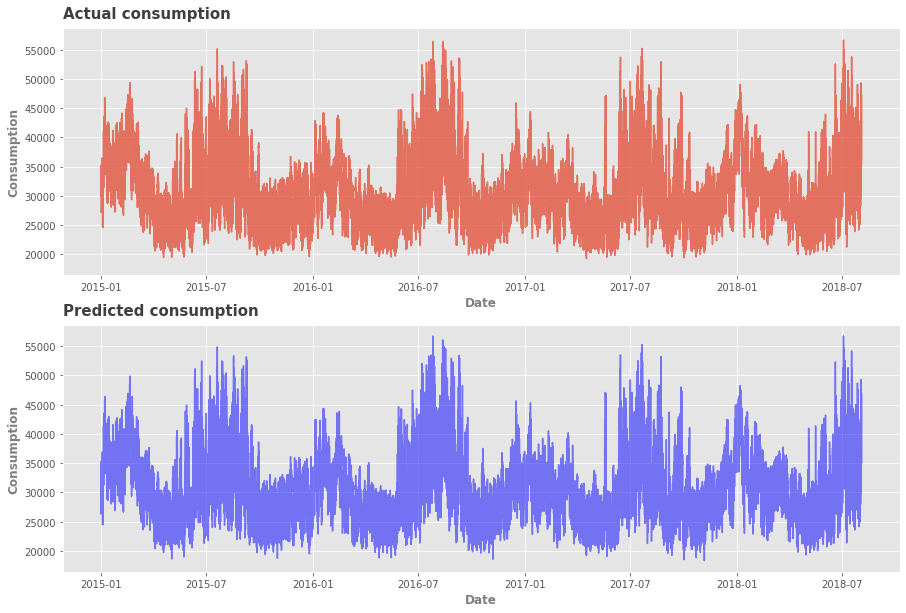

In [194]:
fig,(ax1,ax2) = plt.subplots(2,1,figsize=(15,10),sharey=True)

ax1.plot(consum_test.index,consum_test["PJME_MW"],alpha=0.75)
ax2.plot(consum_test.index,consum_test["Prediction"],color="blue",alpha=0.50)

ax1.set_xlabel("Date", alpha=0.75, weight="bold")
ax1.set_ylabel("Consumption", alpha=0.75, weight="bold")
ax2.set_xlabel("Date", alpha=0.75, weight="bold")
ax2.set_ylabel("Consumption", alpha=0.75, weight="bold")

ax1.set_title("Actual consumption", alpha=0.75, weight="bold", fontsize=15, pad=10, loc="left")
ax2.set_title("Predicted consumption", alpha=0.75, weight="bold", fontsize=15, pad=10, loc="left")

The actual consumption is again covered by the predicted consumption. We have to resort to evaluation metrics.

In [195]:
mean_sq = mean_squared_error(y_test,xgd_reg.predict(X_test))
rmse = np.sqrt(mean_sq)

mean_abs_sq = mean_absolute_error(y_test,xgd_reg.predict(X_test))

print("Root Mean Squared Error : {}".format(rmse))
print("Mean Absolute Error : {}".format(mean_abs_sq))

Root Mean Squared Error : 561.9501934756757
Mean Absolute Error : 369.3511859124066


In [196]:
# Worst Hour Prediction
consum_test["Difference"] = np.abs(consum_test["PJME_MW"] - consum_test["Prediction"])
consum_test["Difference"].sort_values(ascending=False)[:10]

Datetime
2016-07-18 18:00:00    4754.605469
2018-07-17 17:00:00    4480.355469
2018-02-27 13:00:00    4239.808594
2015-01-01 01:00:00    4222.775391
2016-01-06 13:00:00    4093.914062
2018-02-27 12:00:00    4028.386719
2016-01-06 12:00:00    3959.648438
2018-01-26 13:00:00    3909.289062
2015-01-01 03:00:00    3906.332031
2015-02-20 06:00:00    3886.761719
Name: Difference, dtype: float64

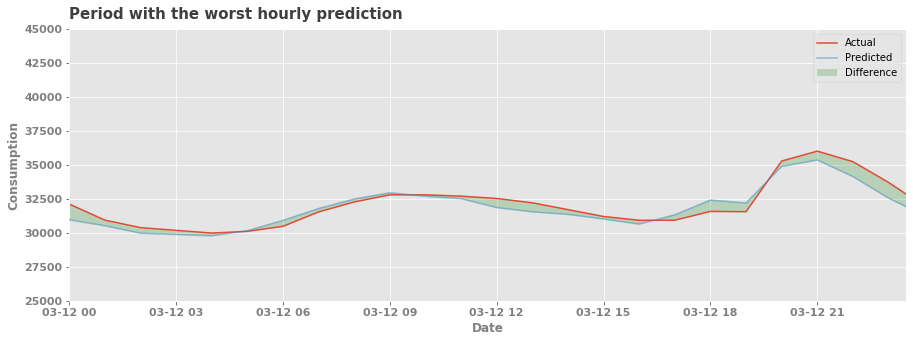

In [197]:
fig,ax= plt.subplots(figsize=(15,5))


ax.plot(consum_test.index,consum_test["PJME_MW"],label="Actual")
ax.plot(consum_test.index,consum_test["Prediction"],alpha=.5,zorder=10,label="Predicted")

consum = consum_test["PJME_MW"]
pred = consum_test["Prediction"]

plt.fill_between(consum_test.index, consum,pred, facecolor="green", alpha=.2,label="Difference")

ax.set_ylim(25000, 45000)
ax.set_xbound(lower="2017-03-12 00:00:00", upper="2017-03-12 23:30:00")

plt.xlabel("Date", alpha=0.75, weight="bold")
plt.ylabel("Consumption", alpha=0.75, weight="bold")

plt.xticks(alpha=0.75,weight="bold", fontsize=11)
plt.yticks(alpha=0.75,weight="bold", fontsize=11)

plt.title("Period with the worst hourly prediction", alpha=0.75, weight="bold", fontsize=15, pad=10, loc="left")
plt.legend()

In [198]:
#Worst Days
worst_days = consum_test.groupby(['Year','Month','Dayofmonth']).mean()[['PJME_MW','Prediction','Difference']]
worst_days.sort_values(by="Difference",ascending=False)[:10]

PJME_MW    Prediction   Difference
Year Month Dayofmonth                                         
2015 2     20          44694.041667  44250.222656  1898.537923
2017 3     23          32248.208333  32991.460938  1136.041341
2015 1     1           31720.521739  30940.314453  1108.471977
2016 1     6           36636.791667  37300.664062  1101.661133
2018 1     1           40191.041667  39387.855469  1080.442708
     3     26          30686.708333  31343.716797  1039.137614
     2     27          29694.041667  30526.451172  1024.217773
2017 3     13          34010.000000  34382.929688  1018.309652
2015 2     24          41002.166667  41022.207031  1000.308919
2018 1     26          34354.958333  35115.886719   998.052572

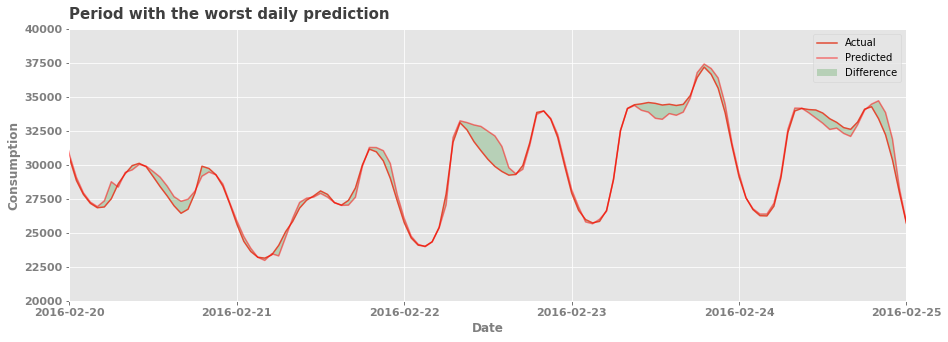

In [199]:
fig,ax= plt.subplots(figsize=(15,5))


ax.plot(consum_test.index,consum_test["PJME_MW"],label="Actual")
ax.plot(consum_test.index,consum_test["Prediction"],color="red",alpha=.5,zorder=10,label="Predicted")

consum = consum_test["PJME_MW"]
pred = consum_test["Prediction"]

plt.fill_between(consum_test.index, consum,pred, facecolor="green", alpha=.2,label="Difference")

ax.set_ylim(20000, 40000)
ax.set_xbound(lower="2016-02-20", upper="2016-02-25")

plt.xlabel("Date", alpha=0.75, weight="bold")
plt.ylabel("Consumption", alpha=0.75, weight="bold")

plt.xticks(alpha=0.75,weight="bold", fontsize=11)
plt.yticks(alpha=0.75,weight="bold", fontsize=11)

plt.title("Period with the worst daily prediction", alpha=0.75, weight="bold", fontsize=15, pad=10, loc="left")

plt.legend()

In [200]:
#Best Days
worst_days.sort_values(by="Difference",ascending=True)[:10]

PJME_MW    Prediction  Difference
Year Month Dayofmonth                                        
2015 10    16          26394.791667  26411.253906  100.766357
2017 5     6           24058.083333  24086.402344  108.175374
2016 9     30          26981.708333  27000.070312  111.136312
     10    1           24848.416667  24827.937500  112.335042
2017 4     22          24219.083333  24143.050781  114.603027
2016 4     29          27014.291667  27004.564453  118.324870
2015 5     21          26886.708333  26876.148438  118.616048
2017 5     23          26905.166667  26912.119141  121.126221
     10    13          26465.458333  26452.572266  122.302409
2015 9     22          28185.875000  28173.357422  123.436523

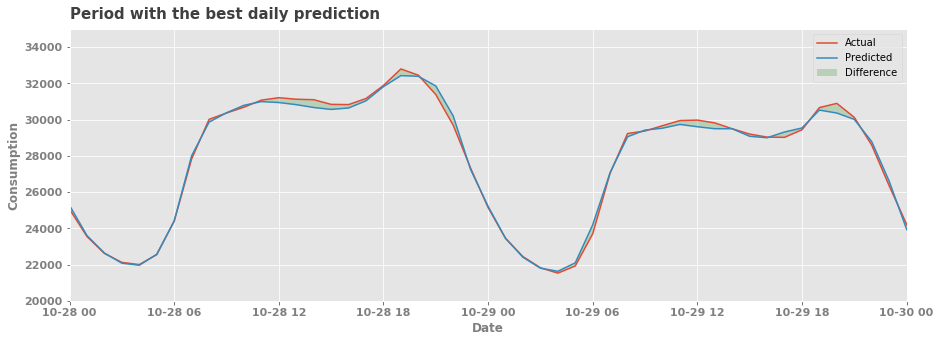

In [201]:
fig,ax= plt.subplots(figsize=(15,5))

ax.plot(consum_test.index,consum_test["PJME_MW"], label="Actual")
ax.plot(consum_test.index,consum_test["Prediction"], label="Predicted")
consum = consum_test["PJME_MW"]
pred = consum_test["Prediction"]

plt.fill_between(consum_test.index, consum,pred, facecolor="green", alpha=.2,label="Difference")

ax.set_ylim(20000, 35000)
ax.set_xbound(lower="2015-10-28", upper="2015-10-30")

plt.xlabel("Date", alpha=0.75, weight="bold")
plt.ylabel("Consumption", alpha=0.75, weight="bold")

plt.xticks(alpha=0.75,weight="bold", fontsize=11)
plt.yticks(alpha=0.75,weight="bold", fontsize=11)

plt.title("Period with the best daily prediction", alpha=0.75, weight="bold", fontsize=15, pad=10, loc="left")


plt.legend()